**Project: Financial news sentiment analyses with Natural Langauge Processing**

**Market Understanding:**
**Natural Language Processing (NLP) holds immense global significance by automating language understanding and processing. It enhances information management, automates tasks, personalizes user experiences, and aids decision-making across industries. In financial markets, NLP is crucial for sentiment analysis, risk management, and algorithmic trading, as it enables real-time insights from news and reports, ensuring better-informed investment decisions and regulatory compliance. Its ability to extract valuable market insights and mitigate risks makes NLP an indispensable tool for modern financial professionals.**

**Objective:Build a competitive Natural Langauge Processing that can competitively classify the financial news text as either positive , neutral or negative.**

**IMPORTING RELEVANT LIBRARIES**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
import re
import spacy
nlp = spacy.load('en_core_web_sm')
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
import joblib
from sklearn.metrics import classification_report, confusion_matrix
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
import pickle
from IPython.display import FileLink



[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


**LOADING THE DATA**

In [2]:
df=pd.read_csv('/kaggle/input/sentiment-analysis-for-financial-news/all-data.csv', header=None , encoding='ISO-8859-1')

In [3]:
df.columns =['Sentiment' ,'Sentence']

**EXPLORATORY DATA ANALYSIS**

In [4]:
df

,Sentiment,Sentence
0,neutral,"According to Gran , the company has no plans t..."
1,neutral,Technopolis plans to develop in stages an area...
2,negative,The international electronic industry company ...
3,positive,With the new production plant the company woul...
4,positive,According to the company 's updated strategy f...
...,...,...
4841,negative,LONDON MarketWatch -- Share prices ended lower...
4842,neutral,Rinkuskiai 's beer sales fell by 6.5 per cent ...
4843,negative,Operating profit fell to EUR 35.4 mn from EUR ...
4844,negative,Net sales of the Paper segment decreased to EU...


In [5]:
df.head()

,Sentiment,Sentence
0,neutral,"According to Gran , the company has no plans t..."
1,neutral,Technopolis plans to develop in stages an area...
2,negative,The international electronic industry company ...
3,positive,With the new production plant the company woul...
4,positive,According to the company 's updated strategy f...


In [6]:
df.tail()

,Sentiment,Sentence
4841,negative,LONDON MarketWatch -- Share prices ended lower...
4842,neutral,Rinkuskiai 's beer sales fell by 6.5 per cent ...
4843,negative,Operating profit fell to EUR 35.4 mn from EUR ...
4844,negative,Net sales of the Paper segment decreased to EU...
4845,negative,Sales in Finland decreased by 10.5 % in Januar...


In [7]:
df.describe().T

,count,unique,top,freq
Sentiment,4846,3,neutral,2879
Sentence,4846,4838,TELECOMWORLDWIRE-7 April 2006-TJ Group Plc sel...,2


In [8]:
df.isnull().sum()

Sentiment    0
Sentence     0
dtype: int64

In [9]:
print(df["Sentiment"].value_counts())

Sentiment
neutral     2879
positive    1363
negative     604
Name: count, dtype: int64


**DATA VISUALISATION**

<Axes: xlabel='Sentiment', ylabel='count'>

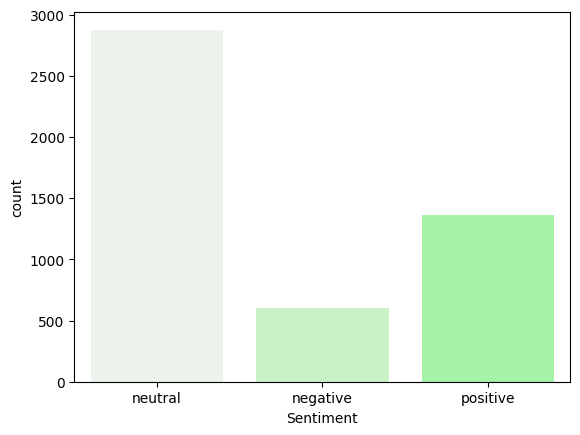

In [10]:
#visualising data distribution
sns.countplot(data=df, x='Sentiment', palette='light:#99FF99')

In [11]:
# grouping the DataFrame by 'Sentiment' and concatenate the sentences within each group.
sentiments = df.groupby('Sentiment')['Sentence'].apply(' '.join)

# sentiments to visualize.
positive = 'positive'
negative = 'negative'
neutral = 'neutral'


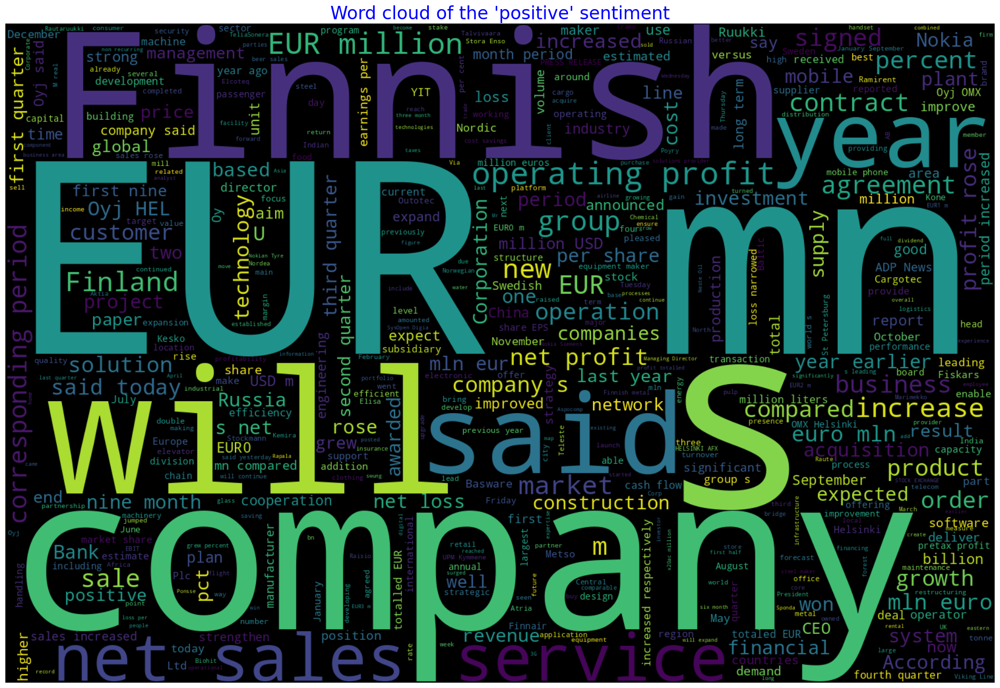

In [12]:
# extracting  the text for the selected sentiment.
text_to_visualize = sentiments.get(positive, '')

# creating and displaying  a word cloud for the selected sentiment.
plt.figure(figsize=(24, 16))
wordcloud = WordCloud(background_color="black", max_words=500, width=1500, height=1000).generate(text_to_visualize)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Word cloud of the 'positive' sentiment", fontsize=24, color='blue')
plt.axis("off")
plt.show()

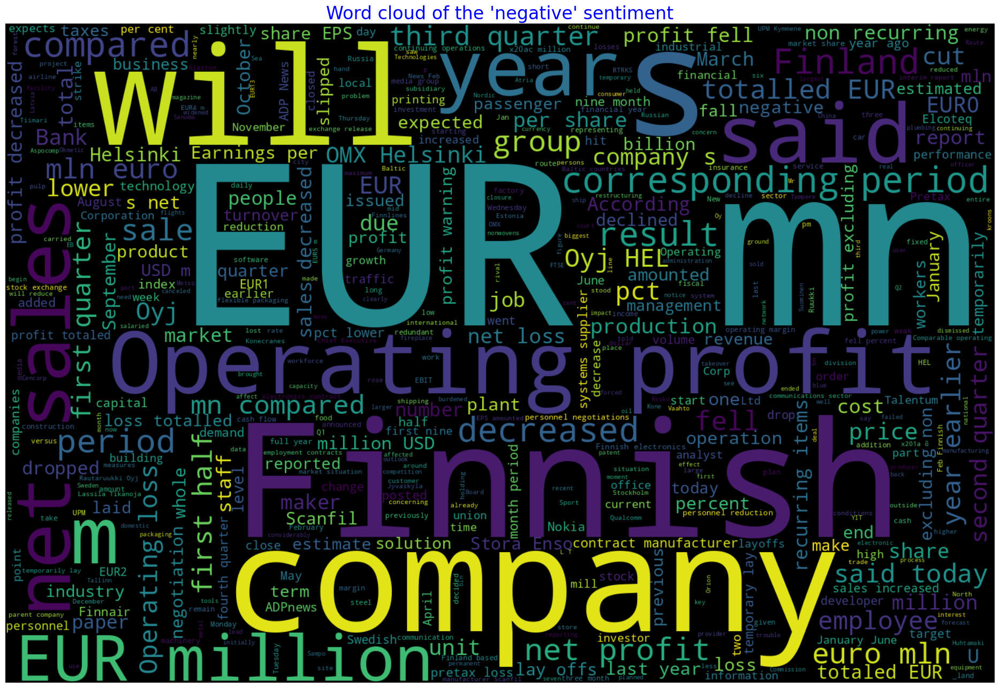

In [13]:
text_to_visualize = sentiments.get(negative, '')

# create and display a word cloud for the selected sentiment.
plt.figure(figsize=(24, 16))
wordcloud = WordCloud(background_color="black", max_words=500, width=1500, height=1000).generate(text_to_visualize)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Word cloud of the 'negative' sentiment", fontsize=24, color='blue')
plt.axis("off")
plt.show()

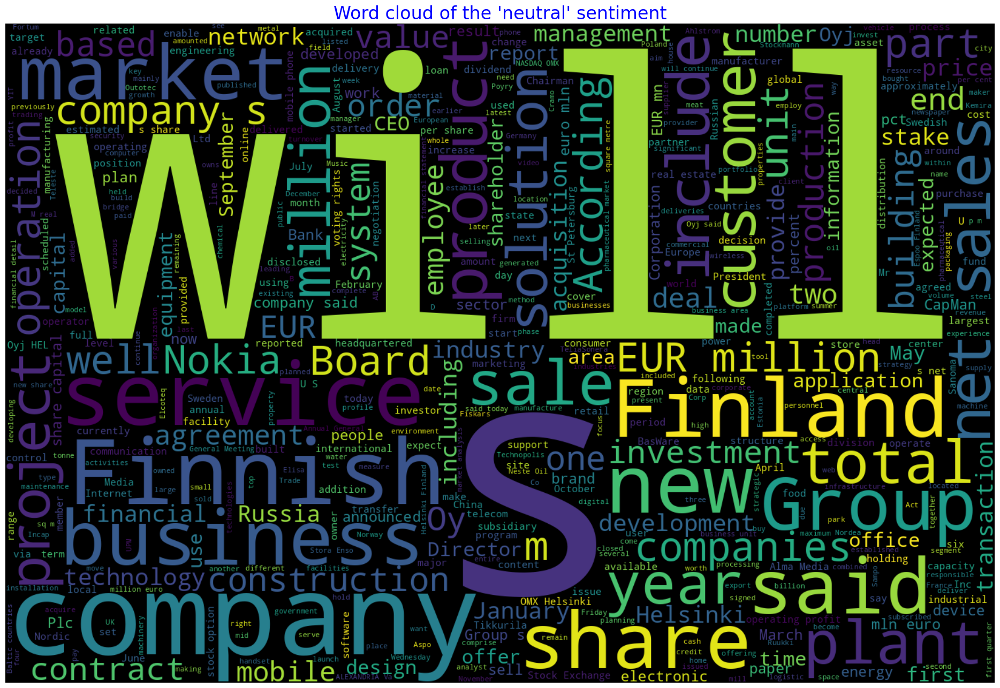

In [14]:
text_to_visualize = sentiments.get(neutral, '')

# Create and display a word cloud for the selected sentiment.
plt.figure(figsize=(24, 16))
wordcloud = WordCloud(background_color="black", max_words=500, width=1500, height=1000).generate(text_to_visualize)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Word cloud of the 'neutral' sentiment", fontsize=24, color='blue')
plt.axis("off")
plt.show()

In [15]:
df.head()

,Sentiment,Sentence
0,neutral,"According to Gran , the company has no plans t..."
1,neutral,Technopolis plans to develop in stages an area...
2,negative,The international electronic industry company ...
3,positive,With the new production plant the company woul...
4,positive,According to the company 's updated strategy f...


In [16]:
# preprocessing  text in the 'Sentence' column
def preprocess_text(text):
    # tokenize the text, remove stopwords, convert to lowercase, and remove numbers and special characters
    words = nltk.word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    filtered_words = [re.sub(r'[^a-zA-Z]', ' ', word.lower()) for word in words if word.lower() not in stop_words]
    return ' '.join(filtered_words)

# Applying the preprocessing function to the 'Text' column
df['Text'] = df['Sentence'].apply(preprocess_text)

print(df)

     Sentiment                                           Sentence  \
0      neutral  According to Gran , the company has no plans t...   
1      neutral  Technopolis plans to develop in stages an area...   
2     negative  The international electronic industry company ...   
3     positive  With the new production plant the company woul...   
4     positive  According to the company 's updated strategy f...   
...        ...                                                ...   
4841  negative  LONDON MarketWatch -- Share prices ended lower...   
4842   neutral  Rinkuskiai 's beer sales fell by 6.5 per cent ...   
4843  negative  Operating profit fell to EUR 35.4 mn from EUR ...   
4844  negative  Net sales of the Paper segment decreased to EU...   
4845  negative  Sales in Finland decreased by 10.5 % in Januar...   

                                                   Text  
0     according gran   company plans move production...  
1     technopolis plans develop stages area less    ...

In [17]:
#removing words of two letters or lower 
df['Text'] = df['Text'].apply(lambda row: ' '.join([word for word in row.split() if len(word)>2]))
df.head()

,Sentiment,Sentence,Text
0,neutral,"According to Gran , the company has no plans t...",according gran company plans move production r...
1,neutral,Technopolis plans to develop in stages an area...,technopolis plans develop stages area less squ...
2,negative,The international electronic industry company ...,international electronic industry company elco...
3,positive,With the new production plant the company woul...,new production plant company would increase ca...
4,positive,According to the company 's updated strategy f...,according company updated strategy years baswa...


**WORD CLOUD AFTER DATA HAS BEEN CLEANED**

In [18]:
# grouping the DataFrame by 'Sentiment' and concatenate the sentences within each group.
sentiments = df.groupby('Sentiment')['Text'].apply(' '.join)

# sentiments to visualize.
positive = 'positive'
negative = 'negative'
neutral = 'neutral'


**WORD CLOUD FOR 'positive'**

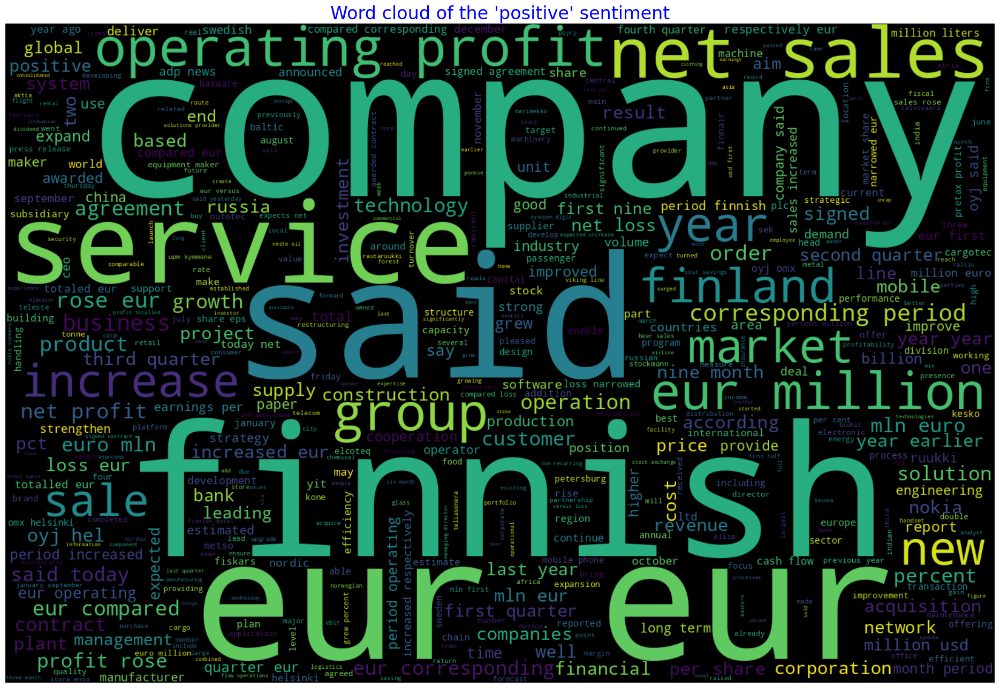

In [19]:
# Extracting  the text for the selected sentiment.
text_to_visualize = sentiments.get(positive, '')


plt.figure(figsize=(24, 16))
wordcloud = WordCloud(background_color="black", max_words=500, width=1500, height=1000).generate(text_to_visualize)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Word cloud of the 'positive' sentiment", fontsize=24, color='blue')
plt.axis("off")
plt.show()

**WORD CLOUD FOR 'negative'**

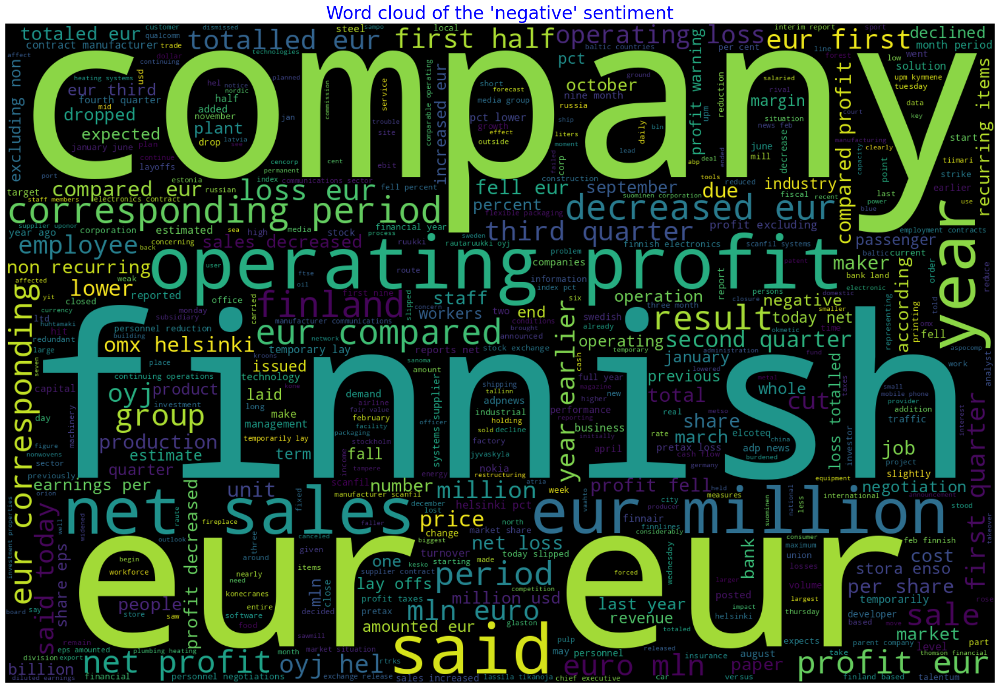

In [20]:
# Extracting  the text for the selected sentiment.
text_to_visualize = sentiments.get(negative, '')


plt.figure(figsize=(24, 16))
wordcloud = WordCloud(background_color="black", max_words=500, width=1500, height=1000).generate(text_to_visualize)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Word cloud of the 'negative' sentiment", fontsize=24, color='blue')
plt.axis("off")
plt.show()

**WORD CLOUD FOR 'neutral'**

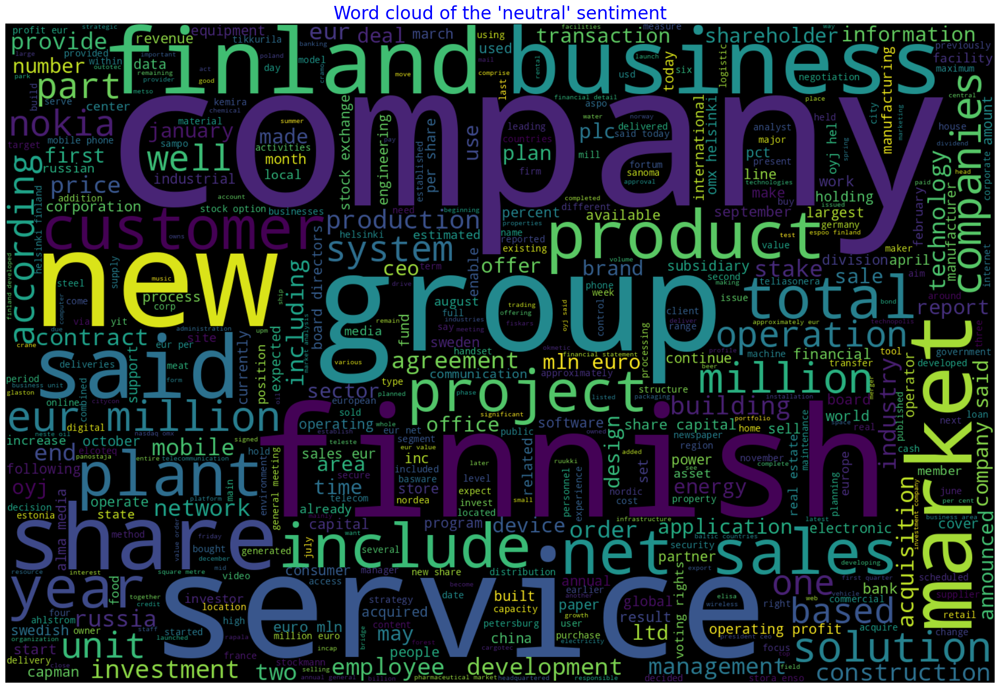

In [21]:
# extracting  the text for the selected sentiment.
text_to_visualize = sentiments.get(neutral, '')

plt.figure(figsize=(24, 16))
wordcloud = WordCloud(background_color="black", max_words=500, width=1500, height=1000).generate(text_to_visualize)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Word cloud of the 'neutral' sentiment", fontsize=24, color='blue')
plt.axis("off")
plt.show()

In [22]:
#text vectorization
vectorizer = TfidfVectorizer(sublinear_tf=True, encoding='utf-8', decode_error='ignore') #stop_words='english')
X = vectorizer.fit_transform(df['Text'])

**Approach 1**

In [23]:
# data splitting
y = df['Sentiment']  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [24]:
# model training
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

rf_classifier.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [25]:
from sklearn.metrics import accuracy_score, classification_report

# predictions
y_pred = rf_classifier.predict(X_test)

# evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# classification report

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report Approach 1:\n", class_report)

# report = classification_report(y_test, y_pred)
# print(report)

Accuracy: 0.7463917525773196
Classification Report Approach 1:
               precision    recall  f1-score   support

    negative       0.73      0.43      0.54       110
     neutral       0.74      0.96      0.83       571
    positive       0.80      0.44      0.57       289

    accuracy                           0.75       970
   macro avg       0.76      0.61      0.65       970
weighted avg       0.75      0.75      0.72       970



**Approach 2**

In [26]:

# function to preprocess text
def preprocess_text(text):
    words = nltk.word_tokenize(text)
    stop_words = set(nltk.corpus.stopwords.words('english'))
    filtered_words = [word.lower() for word in words if word.lower() not in stop_words]
    return ' '.join(filtered_words)

# splitting the data into features (X) and labels (y)
X = df['Sentence']
y = df['Sentiment']
 

# splitting  the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# creating  a pipeline with preprocessing and the model
text_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(sublinear_tf=True, encoding='utf-8', decode_error='ignore', preprocessor=preprocess_text)),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))  # Random Forest classifier
])

# fitting of the pipeline on the training data
text_pipeline.fit(X_train, y_train)

# test data predictions
y_pred = text_pipeline.predict(X_test)


Accuracy: 0.7536082474226804
Classification Report Approach 2:
               precision    recall  f1-score   support

    negative       0.75      0.44      0.55       110
     neutral       0.75      0.96      0.84       571
    positive       0.78      0.47      0.59       289

    accuracy                           0.75       970
   macro avg       0.76      0.62      0.66       970
weighted avg       0.76      0.75      0.73       970



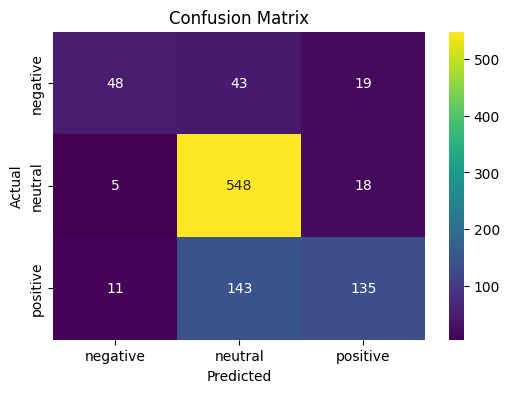

In [27]:
# Calculating the  accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report Approach 2:\n", class_report)

# confusion matrix (heatmap)
confusion_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap="viridis", xticklabels=text_pipeline.classes_, yticklabels=text_pipeline.classes_) #otherwise Blues for color 
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

**Approach 3**

In [28]:
#Categoricial target values
df['Sentiment'] = df['Sentiment'].replace('positive', 1)
df['Sentiment'] = df['Sentiment'].replace('neutral', 0)
df['Sentiment'] = df['Sentiment'].replace('negative', -1)

In [29]:
df

,Sentiment,Sentence,Text
0,0,"According to Gran , the company has no plans t...",according gran company plans move production r...
1,0,Technopolis plans to develop in stages an area...,technopolis plans develop stages area less squ...
2,-1,The international electronic industry company ...,international electronic industry company elco...
3,1,With the new production plant the company woul...,new production plant company would increase ca...
4,1,According to the company 's updated strategy f...,according company updated strategy years baswa...
...,...,...,...
4841,-1,LONDON MarketWatch -- Share prices ended lower...,london marketwatch share prices ended lower lo...
4842,0,Rinkuskiai 's beer sales fell by 6.5 per cent ...,rinkuskiai beer sales fell per cent million li...
4843,-1,Operating profit fell to EUR 35.4 mn from EUR ...,operating profit fell eur eur including vessel...
4844,-1,Net sales of the Paper segment decreased to EU...,net sales paper segment decreased eur second q...


In [30]:
df = df[['Sentence', 'Text', 'Sentiment']]

In [31]:
df


,Sentence,Text,Sentiment
0,"According to Gran , the company has no plans t...",according gran company plans move production r...,0
1,Technopolis plans to develop in stages an area...,technopolis plans develop stages area less squ...,0
2,The international electronic industry company ...,international electronic industry company elco...,-1
3,With the new production plant the company woul...,new production plant company would increase ca...,1
4,According to the company 's updated strategy f...,according company updated strategy years baswa...,1
...,...,...,...
4841,LONDON MarketWatch -- Share prices ended lower...,london marketwatch share prices ended lower lo...,-1
4842,Rinkuskiai 's beer sales fell by 6.5 per cent ...,rinkuskiai beer sales fell per cent million li...,0
4843,Operating profit fell to EUR 35.4 mn from EUR ...,operating profit fell eur eur including vessel...,-1
4844,Net sales of the Paper segment decreased to EU...,net sales paper segment decreased eur second q...,-1


**DATA RESAMPLING**

Our data is imbalanced.Lets get it balanced before we feed it into the next model

In [32]:
#selecting the dependent and independent variable
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

In [33]:
from imblearn.over_sampling import RandomOverSampler

# Initialize Random Oversampler
ros = RandomOverSampler(sampling_strategy='auto', random_state=42)

# applying  Random Oversampling to the  data
X_res, y_res = ros.fit_resample(X, y)

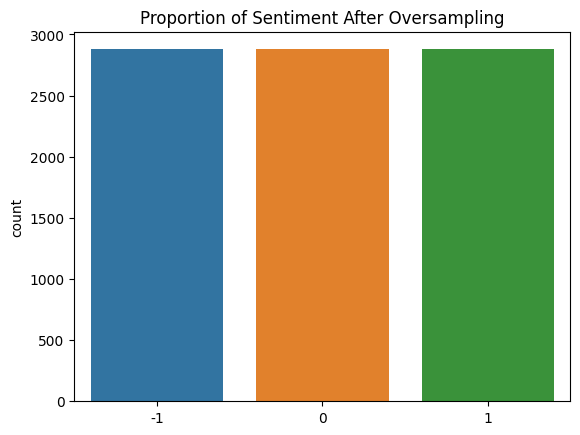

In [34]:
# Plot Proportion of Sentiments After Oversamplings
sns.countplot(x=y_res).set(title='Proportion of Sentiment After Oversampling')
sns.set_palette("Set3")

Lets now use this balanced data for our next model 

In [35]:
# the CountVectorizer object
cv = CountVectorizer()

# converting the text data into lowercase and split into features and target variable
X_res =df['Text'].str.lower()
y_res = df['Sentiment']
# fitting  and transforming  the input data (X)
X_res = cv.fit_transform(X_res)

In [36]:
# splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res,test_size=0.25,random_state=42)


In [37]:
# MultinomialNB model  without hyperparameters
nb = MultinomialNB()
nb.fit(X_train,y_train)
MultinomialNB()

#predictions on the testing set
predictions = nb.predict(X_test)

Classification Report Approach 3:
               precision    recall  f1-score   support

          -1       0.56      0.52      0.54       143
           0       0.78      0.81      0.79       713
           1       0.62      0.60      0.61       356

    accuracy                           0.71      1212
   macro avg       0.66      0.64      0.65      1212
weighted avg       0.71      0.71      0.71      1212



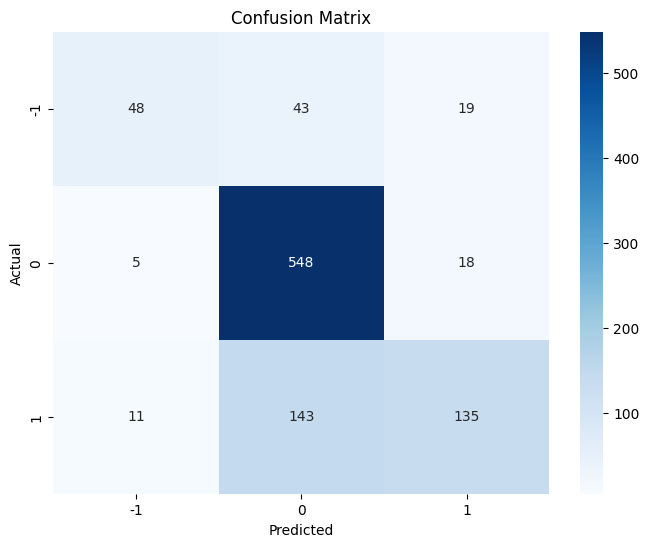

In [38]:
# Generate a classification report
class_report = classification_report(y_test, predictions)
print("Classification Report Approach 3:\n", class_report)


# heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt="d", cmap="Blues", xticklabels=nb.classes_, yticklabels=nb.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

**From the above approaches , approach  3(text_pipeline) has the best perfomance with the accuracy of 75.36%.We will be deploying the text_pipeline to classify financial news sentiment analyses.**

In [39]:
# Saving the model
filename = 'fin_sent_pred.pickle'
pickle.dump(text_pipeline, open(filename, 'wb'))

In [40]:
#loading the model
loaded_model = pickle.load(open(filename, 'rb'))

# sentence we would like a prediction on from the 'fin_sent_pred' model
new_data = ["Investors are very pleased about the prospects of the company after the recent appointment of a vastly experienced Director."]

predictions = loaded_model.predict(new_data)
print(predictions)

['positive']


In [41]:
FileLink('fin_sent_pred.pickle')

/kaggle/working/fin_sent_pred.pickle